In [1]:
#import lightgbm
import random
import pandas as pd
import numpy as np
import os
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split, GridSearchCV, PredefinedSplit, KFold, TimeSeriesSplit
from sklearn.metrics import make_scorer
import matplotlib.pyplot as plt
from tqdm import tqdm
from sktime.forecasting.model_selection import temporal_train_test_split
from sktime.utils.plotting import plot_series

import warnings
warnings.filterwarnings(action='ignore')

def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)

seed_everything(42) # Seed 고정

In [2]:
#데이터 불러오기
train_df = pd.read_csv('./data/train.csv')
test_df = pd.read_csv('./data/test.csv')
building_info =  pd.read_csv('./data/building_info.csv')

train_df = train_df.rename(columns={
    '건물번호': 'building_number',
    '일시': 'date_time',
    '기온(C)': 'temperature',
    '강수량(mm)': 'rainfall',
    '풍속(m/s)': 'windspeed',
    '습도(%)': 'humidity',
    '일조(hr)': 'sunshine',
    '일사(MJ/m2)': 'solar_radiation',
    '전력소비량(kWh)': 'power_consumption'
})
test_df = test_df.rename(columns={
    '건물번호': 'building_number',
    '일시': 'date_time',
    '기온(C)': 'temperature',
    '강수량(mm)': 'rainfall',
    '풍속(m/s)': 'windspeed',
    '습도(%)': 'humidity',
    '일조(hr)': 'sunshine',
    '일사(MJ/m2)': 'solar_radiation',
    '전력소비량(kWh)': 'power_consumption'
})
building_info = building_info.rename(columns={
    '건물번호': 'building_number',
    '건물유형': 'building_type',
    '연면적(m2)': 'total_area',
    '냉방면적(m2)': 'cooling_area',
    '태양광용량(kW)': 'solar_power_capacity',
    'ESS저장용량(kWh)': 'ess_capacity',
    'PCS용량(kW)': 'pcs_capacity'
})
translation_dict = {
    '건물기타': 'Other Buildings',
    '공공': 'Public',
    '대학교': 'University',
    '데이터센터': 'Data Center',
    '백화점및아울렛': 'Department Store and Outlet',
    '병원': 'Hospital',
    '상용': 'Commercial',
    '아파트': 'Apartment',
    '연구소': 'Research Institute',
    '지식산업센터': 'Knowledge Industry Center',
    '할인마트': 'Discount Mart',
    '호텔및리조트': 'Hotel and Resort'
}

building_info['building_type'] = building_info['building_type'].replace(translation_dict)


train_df.head()

,num_date_time,building_number,date_time,temperature,rainfall,windspeed,humidity,sunshine,solar_radiation,power_consumption
0,1_20220601 00,1,20220601 00,18.6,NaN,0.9,42.0,NaN,NaN,1085.28
1,1_20220601 01,1,20220601 01,18.0,NaN,1.1,45.0,NaN,NaN,1047.36
2,1_20220601 02,1,20220601 02,17.7,NaN,1.5,45.0,NaN,NaN,974.88
3,1_20220601 03,1,20220601 03,16.7,NaN,1.4,48.0,NaN,NaN,953.76
4,1_20220601 04,1,20220601 04,18.4,NaN,2.8,43.0,NaN,NaN,986.40


In [3]:
test_df.head()

,num_date_time,building_number,date_time,temperature,rainfall,windspeed,humidity
0,1_20220825 00,1,20220825 00,23.5,0.0,2.2,72
1,1_20220825 01,1,20220825 01,23.0,0.0,0.9,72
2,1_20220825 02,1,20220825 02,22.7,0.0,1.5,75
3,1_20220825 03,1,20220825 03,22.1,0.0,1.3,78
4,1_20220825 04,1,20220825 04,21.8,0.0,1.0,77


In [4]:
building_info.head()

,building_number,building_type,total_area,cooling_area,solar_power_capacity,ess_capacity,pcs_capacity
0,1,Other Buildings,110634.00,39570.00,-,-,-
1,2,Other Buildings,122233.47,99000.00,-,-,-
2,3,Other Buildings,171243.00,113950.00,40,-,-
3,4,Other Buildings,74312.98,34419.62,60,-,-
4,5,Other Buildings,205884.00,150000.00,-,2557,1000


Train 과 Test의 차이: columns에 일조, 일사, 전력 소비량이 없다.

## 전처리 (병합, 빈칸 채우기, 형 변환, num_date_time 삭제)

In [3]:

pd.set_option('display.max_columns', 30)

def merge(df):
    df = df.fillna(0)
    date = pd.to_datetime(df.date_time)
    df['hour'] = date.dt.hour
    df['day'] = date.dt.weekday
    df['month'] = date.dt.month
    df['week'] = date.dt.weekofyear
    
    # 'building_number'를 기준으로 두 데이터프레임 병합 및 전처리
    merged_df = pd.merge(df, building_info, on='building_number',how='right')
    #merge후 전처리
    merged_df['solar_power_capacity'] = merged_df['solar_power_capacity'].replace('-', 0)
    merged_df['ess_capacity'] = merged_df['ess_capacity'].replace('-', 0)
    merged_df['pcs_capacity'] = merged_df['pcs_capacity'].replace('-', 0)

    merged_df['solar_power_capacity'] = merged_df['solar_power_capacity'].astype('float64')
    merged_df['ess_capacity'] = merged_df['ess_capacity'].astype('float64')
    merged_df['pcs_capacity'] = merged_df['pcs_capacity'].astype('float64')
    return merged_df.drop(columns =['num_date_time','building_type'])


merged_train_df = merge(train_df)
merged_test_df = merge(test_df)

#######################################
## 건물별, 요일별, 시간별 발전량 평균 넣어주기
#######################################
power_mean = pd.pivot_table(merged_train_df, values = 'power_consumption', index = ['building_number', 'hour', 'day'], aggfunc = np.mean).reset_index()
tqdm.pandas()
#######################################
## 건물별 시간별 발전량 평균 넣어주기
#######################################
power_hour_mean = pd.pivot_table(merged_train_df, values = 'power_consumption', index = ['building_number', 'hour'], aggfunc = np.mean).reset_index()
tqdm.pandas()
    #######################################
## 건물별 시간별 발전량 표준편차 넣어주기
#######################################
power_hour_std = pd.pivot_table(merged_train_df, values = 'power_consumption', index = ['building_number', 'hour'], aggfunc = np.std).reset_index()
tqdm.pandas()

In [4]:
def preprocessing(df):
    df['day_hour_mean'] = df.progress_apply(lambda x : power_mean.loc[(power_mean.building_number == x['building_number']) & (power_mean.hour == x['hour']) & (power_mean.day == x['day']) ,'power_consumption'].values[0], axis = 1)
    df['hour_mean'] = df.progress_apply(lambda x : power_hour_mean.loc[(power_hour_mean.building_number == x['building_number']) & (power_hour_mean.hour == x['hour']) ,'power_consumption'].values[0], axis = 1)   
    df['hour_std'] = df.progress_apply(lambda x : power_hour_std.loc[(power_hour_std.building_number == x['building_number']) & (power_hour_std.hour == x['hour']) ,'power_consumption'].values[0], axis = 1)
    
    def CDH(xs):
        ys = []
        for i in range(len(xs)):
            if i < 11:
                ys.append(np.sum(xs[:(i+1)]-26))
            else:
                ys.append(np.sum(xs[(i-11):(i+1)]-26))
        return np.array(ys)

    cdhs = np.array([])
    for num in range(1,101,1):
        temp = df[df['building_number'] == num]
        cdh = CDH(temp['temperature'].values)
        cdhs = np.concatenate([cdhs, cdh])
    df['CDH'] = cdhs
    
    ### 공휴일 변수 추가
    df['holiday'] = df.apply(lambda x : 0 if x['day']<5 else 1, axis = 1)
    df.loc[('2022-08-15'<=df.date_time)&(df.date_time<'2022-06-01')&(df.date_time<'2022-06-06'), 'holiday'] = 1

    ## https://dacon.io/competitions/official/235680/codeshare/2366?page=1&dtype=recent
    df['sin_time'] = np.sin(2*np.pi*df.hour/24)
    df['cos_time'] = np.cos(2*np.pi*df.hour/24)
    
    ## https://dacon.io/competitions/official/235736/codeshare/2743?page=1&dtype=recent
    df['THI'] = 9/5*df['temperature'] - 0.55*(1-df['humidity']/100)*(9/5*df['humidity']-26)+32

    
    return df

merged_train_df =preprocessing(merged_train_df)
merged_test_df =preprocessing(merged_test_df)


100%|██████████| 16800/16800 [00:05<00:00, 2822.24it/s]


KeyError: "['Unnamed: 0'] not found in axis"

In [5]:

def data_train(df):

    df['cooling_to_total_area_ratio'] =  df['cooling_area'] / df['total_area']
    
    grouped = df.groupby(['building_number', 'week', 'day'])

    df['max_power'] = grouped['power_consumption'].transform(np.max)
    df['min_power'] = grouped['power_consumption'].transform(np.min)
    
    grouped2 = df.groupby(['building_number', 'week', 'day','holiday'])

    df['max_power'] = grouped2['max_power'].transform(np.mean)
    df['min_power'] = grouped2['min_power'].transform(np.mean)

    df['solar_to_ess_ratio'] = df['solar_power_capacity'] / df['ess_capacity']
    #df['efficiency'] = df['pcs_capacity'] / df['power_consumption']
    
    df.replace([np.inf, -np.inf], np.nan, inplace=True)
    df.fillna(0,inplace=True)
    ## StandardScaler 객체 생성
    #from sklearn.preprocessing import MinMaxScaler
    # scaler = MinMaxScaler()
    ## 데이터 표준화
    # df['solar_to_ess_ratio'] = scaler.fit_transform(df[['solar_to_ess_ratio']])
    # df['efficiency'] = scaler.fit_transform(df[['efficiency']])
    df.drop(columns=['sunshine','pcs_capacity','ess_capacity','solar_power_capacity','solar_radiation','total_area','cooling_area'],inplace= True)
        
    return df

def data_test(df):

    df['cooling_to_total_area_ratio'] =  df['cooling_area'] / df['total_area']
    
    grouped = merged_train_df.groupby(['building_number', 'holiday'])

    df['max_power'] = grouped['max_power'].transform(np.mean)
    df['min_power'] = grouped['min_power'].transform(np.mean)

    df['solar_to_ess_ratio'] = df['solar_power_capacity'] / df['ess_capacity']
    #df['efficiency'] = df['pcs_capacity'] / df['power_consumption']
    
    df.replace([np.inf, -np.inf], np.nan, inplace=True)
    df.fillna(0,inplace=True)
    ## StandardScaler 객체 생성
    #from sklearn.preprocessing import MinMaxScaler
    # scaler = MinMaxScaler()
    ## 데이터 표준화
    # df['solar_to_ess_ratio'] = scaler.fit_transform(df[['solar_to_ess_ratio']])
    # df['efficiency'] = scaler.fit_transform(df[['efficiency']])
    df.drop(columns=['pcs_capacity','ess_capacity','solar_power_capacity','total_area','cooling_area'],inplace= True)
        
    return df



merged_train_df =data_train(merged_train_df)
merged_test_df =data_test(merged_test_df)


In [6]:
merged_train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 204000 entries, 0 to 203999
Data columns (total 23 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   building_number              204000 non-null  int64  
 1   date_time                    204000 non-null  object 
 2   temperature                  204000 non-null  float64
 3   rainfall                     204000 non-null  float64
 4   windspeed                    204000 non-null  float64
 5   humidity                     204000 non-null  float64
 6   power_consumption            204000 non-null  float64
 7   hour                         204000 non-null  int64  
 8   day                          204000 non-null  int64  
 9   month                        204000 non-null  int64  
 10  week                         204000 non-null  int64  
 11  day_hour_mean                204000 non-null  float64
 12  hour_mean                    204000 non-null  float64
 13 

In [7]:
## save the preprocessed data
merged_train_df.drop(columns=['date_time']).to_csv('./data/train_preprocessed_add_lbw.csv')
merged_test_df.drop(columns=['date_time']).to_csv('./data/test_preprocessed_add_lbw.csv')

## 추가 전처리

In [3]:
## save the preprocessed data
merged_train_df = pd.read_csv('./data/train_preprocessed_add_lbw.csv')
merged_test_df = pd.read_csv('./data/test_preprocessed_add_lbw.csv')



## 원핫 인코딩(안해도 됨)

In [10]:
# merged_train_df = pd.get_dummies(merged_train_df, prefix=["bt:"], columns=["building_type"])
# merged_train_df.head()
# merged_test_df = pd.get_dummies(merged_test_df, prefix=["bt:"], columns=["building_type"])
# merged_test_df.head()

## 성능 평가지표 정의 및 SMAPE 정의

In [4]:
#### alpha를 argument로 받는 함수로 실제 objective function을 wrapping하여 alpha값을 쉽게 조정할 수 있도록 작성했습니다.
# custom objective function for forcing model not to underestimate
def weighted_mse(alpha = 1):
    def weighted_mse_fixed(label, pred):
        residual = (label - pred).astype("float")
        grad = np.where(residual>0, -2*alpha*residual, -2*residual)
        hess = np.where(residual>0, 2*alpha, 2.0)
        return grad, hess
    return weighted_mse_fixed

 #점수 측정을 위한 코드
def SMAPE(y_true, y_pred):
    return 100/len(y_true) * np.sum(2 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred)))

## 최적의 파라미터 탐색

In [6]:

df = pd.DataFrame(columns = ['n_estimators', 'eta', 'min_child_weight','max_depth', 'colsample_bytree', 'subsample'])
preds = np.array([])

grid = {'n_estimators' : [100], 'eta' : [0.01], 'min_child_weight' : np.arange(1, 8, 1),
        'max_depth' : np.arange(3,9,1) , 'colsample_bytree' :np.arange(0.8, 1.0, 0.1),
        'subsample' :np.arange(0.8, 1.0, 0.1)} # fix the n_estimators & eta(learning rate)

#tscv = TimeSeriesSplit(n_splits=3)
smape_score = make_scorer(SMAPE, greater_is_better=False)

for i in tqdm(np.arange(1, 101, 1)):
    y = merged_train_df.loc[merged_train_df.building_number == i, 'power_consumption']
    x = merged_train_df.loc[merged_train_df.building_number == i].drop(['power_consumption'], axis=1)
    y_train, y_test, x_train, x_test = temporal_train_test_split(y = y, X = x, test_size = 168)

    pds = PredefinedSplit(np.append(-np.ones(len(x_train)-168), np.zeros(168)))
    gcv = GridSearchCV(estimator = XGBRegressor(seed=0, tree_method="hist"),
                       param_grid=grid, scoring=smape_score, cv=pds, refit=True, verbose=True)
    
    # gcv = GridSearchCV(estimator = XGBRegressor(seed = 0, gpu_id = 1, tree_method = 'gpu_hist', predictor= 'gpu_predictor'),
    #                     param_grid = grid, scoring = smape_score, cv = pds, refit = True, verbose = True)

    gcv.fit(x_train, y_train)
    best = gcv.best_estimator_
    params = gcv.best_params_
    print(params)
    pred = best.predict(x_test)
    building = 'building'+str(i)
    print(building + '|| SMAPE : {}'.format(SMAPE(y_test, pred)))
    preds = np.append(preds, pred)
    df = pd.concat([df, pd.DataFrame(params, index=[0])], axis=0)
    df.to_csv('./parameters/hyperparameter_xgb4_lbw.csv', index=False) # save the tuned parameters


  0%|          | 0/100 [00:00<?, ?it/s]

Fitting 1 folds for each of 168 candidates, totalling 168 fits


  1%|          | 1/100 [00:14<23:36, 14.31s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.9}
building1|| SMAPE : 44.29969401032599
Fitting 1 folds for each of 168 candidates, totalling 168 fits


  2%|▏         | 2/100 [00:28<23:21, 14.30s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 8, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.9}
building2|| SMAPE : 40.593177684186564
Fitting 1 folds for each of 168 candidates, totalling 168 fits


  3%|▎         | 3/100 [00:43<23:45, 14.70s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 8, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building3|| SMAPE : 40.32343781255556
Fitting 1 folds for each of 168 candidates, totalling 168 fits


  4%|▍         | 4/100 [00:55<21:39, 13.53s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building4|| SMAPE : 43.25260820968423
Fitting 1 folds for each of 168 candidates, totalling 168 fits


  5%|▌         | 5/100 [01:12<23:35, 14.90s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building5|| SMAPE : 46.76007813443235
Fitting 1 folds for each of 168 candidates, totalling 168 fits


  6%|▌         | 6/100 [01:31<25:36, 16.35s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building6|| SMAPE : 46.43037423217217
Fitting 1 folds for each of 168 candidates, totalling 168 fits


  7%|▋         | 7/100 [02:09<35:58, 23.21s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building7|| SMAPE : 42.47949253771042
Fitting 1 folds for each of 168 candidates, totalling 168 fits


  8%|▊         | 8/100 [02:25<32:04, 20.92s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.9}
building8|| SMAPE : 45.0427439576859
Fitting 1 folds for each of 168 candidates, totalling 168 fits


  9%|▉         | 9/100 [02:46<32:04, 21.14s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.9}
building9|| SMAPE : 45.36081793535299
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 10%|█         | 10/100 [03:04<30:00, 20.01s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.9}
building10|| SMAPE : 45.34822533941546
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 11%|█         | 11/100 [03:26<30:31, 20.58s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8}
building11|| SMAPE : 43.12094542434002
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 12%|█▏        | 12/100 [03:50<31:45, 21.66s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building12|| SMAPE : 45.663293319110394
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 13%|█▎        | 13/100 [04:08<29:49, 20.56s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8}
building13|| SMAPE : 45.09452666523007
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 14%|█▍        | 14/100 [04:32<30:47, 21.49s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.8}
building14|| SMAPE : 43.975307458755815
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 15%|█▌        | 15/100 [04:51<29:43, 20.98s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building15|| SMAPE : 42.67924646559345
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 16%|█▌        | 16/100 [05:14<30:02, 21.46s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 7, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.9}
building16|| SMAPE : 44.117480030169986
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 17%|█▋        | 17/100 [05:35<29:17, 21.18s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building17|| SMAPE : 47.97631548460649
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 18%|█▊        | 18/100 [05:55<28:50, 21.11s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building18|| SMAPE : 47.824123936119975
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 19%|█▉        | 19/100 [06:55<44:04, 32.65s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building19|| SMAPE : 49.41557442093248
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 20%|██        | 20/100 [07:34<45:56, 34.46s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building20|| SMAPE : 46.033478019157094
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 21%|██        | 21/100 [08:05<44:11, 33.56s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building21|| SMAPE : 44.48674951496015
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 22%|██▏       | 22/100 [08:30<40:05, 30.84s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building22|| SMAPE : 45.760692859101
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 23%|██▎       | 23/100 [08:53<36:36, 28.53s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building23|| SMAPE : 45.29148624460593
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 24%|██▍       | 24/100 [09:18<35:00, 27.64s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.8}
building24|| SMAPE : 44.2207934144913
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 25%|██▌       | 25/100 [09:44<33:55, 27.15s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.9}
building25|| SMAPE : 46.31564526463442
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 26%|██▌       | 26/100 [10:10<33:02, 26.79s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.9}
building26|| SMAPE : 44.797262892763456
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 27%|██▋       | 27/100 [10:35<31:54, 26.22s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building27|| SMAPE : 43.86715631766099
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 28%|██▊       | 28/100 [11:03<32:01, 26.69s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.8}
building28|| SMAPE : 42.84269470021972
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 29%|██▉       | 29/100 [11:27<30:37, 25.88s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.8}
building29|| SMAPE : 43.05757912411715
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 30%|███       | 30/100 [11:56<31:07, 26.68s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building30|| SMAPE : 45.35889906399929
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 31%|███       | 31/100 [12:18<29:19, 25.49s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.8}
building31|| SMAPE : 42.52477808880063
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 32%|███▏      | 32/100 [12:29<23:46, 20.98s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building32|| SMAPE : 44.42644771051058
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 33%|███▎      | 33/100 [12:39<19:51, 17.79s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building33|| SMAPE : 44.94746381422902
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 34%|███▍      | 34/100 [12:50<17:12, 15.65s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building34|| SMAPE : 44.66700390488141
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 35%|███▌      | 35/100 [13:00<15:12, 14.03s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building35|| SMAPE : 44.99129645177508
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 36%|███▌      | 36/100 [13:09<13:23, 12.55s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building36|| SMAPE : 44.971382594786675
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 37%|███▋      | 37/100 [13:36<17:42, 16.86s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.9}
building37|| SMAPE : 44.912700427059754
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 38%|███▊      | 38/100 [14:07<21:42, 21.01s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.9}
building38|| SMAPE : 45.1440894534762
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 39%|███▉      | 39/100 [14:35<23:36, 23.23s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building39|| SMAPE : 46.21834246811726
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 40%|████      | 40/100 [15:08<26:13, 26.23s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.9}
building40|| SMAPE : 41.773849550970844
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 41%|████      | 41/100 [15:39<27:11, 27.66s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.9}
building41|| SMAPE : 45.40589720822982
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 42%|████▏     | 42/100 [16:10<27:31, 28.47s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.9}
building42|| SMAPE : 44.74280135659172
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 43%|████▎     | 43/100 [16:37<26:48, 28.23s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8}
building43|| SMAPE : 45.63074169956574
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 44%|████▍     | 44/100 [17:05<26:09, 28.03s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.8}
building44|| SMAPE : 43.979972420182975
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 45%|████▌     | 45/100 [17:30<24:53, 27.16s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building45|| SMAPE : 46.19839479484237
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 46%|████▌     | 46/100 [17:56<24:03, 26.73s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.9}
building46|| SMAPE : 44.315391215236325
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 47%|████▋     | 47/100 [18:20<22:52, 25.89s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8}
building47|| SMAPE : 43.06739028892281
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 48%|████▊     | 48/100 [18:46<22:33, 26.03s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.9}
building48|| SMAPE : 45.50592196538211
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 49%|████▉     | 49/100 [19:08<21:09, 24.90s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building49|| SMAPE : 47.49762151894007
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 50%|█████     | 50/100 [19:25<18:34, 22.30s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building50|| SMAPE : 43.50976705419529
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 51%|█████     | 51/100 [19:42<17:04, 20.91s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building51|| SMAPE : 46.78025997698602
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 52%|█████▏    | 52/100 [20:00<16:00, 20.00s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building52|| SMAPE : 46.15384523712101
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 53%|█████▎    | 53/100 [20:32<18:34, 23.71s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8}
building53|| SMAPE : 41.12730575975148
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 54%|█████▍    | 54/100 [21:05<20:14, 26.40s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building54|| SMAPE : 50.936904783485105
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 55%|█████▌    | 55/100 [21:25<18:26, 24.58s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8}
building55|| SMAPE : 45.33917272823005
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 56%|█████▌    | 56/100 [21:43<16:32, 22.55s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8}
building56|| SMAPE : 44.74989455574846
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 57%|█████▋    | 57/100 [22:14<17:56, 25.03s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building57|| SMAPE : 45.02184003191462
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 58%|█████▊    | 58/100 [22:28<15:16, 21.83s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building58|| SMAPE : 45.499156684493194
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 59%|█████▉    | 59/100 [23:00<16:50, 24.65s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.8}
building59|| SMAPE : 43.13975233504777
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 60%|██████    | 60/100 [23:29<17:24, 26.10s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.9}
building60|| SMAPE : 45.44164716826485
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 61%|██████    | 61/100 [23:56<17:08, 26.38s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8}
building61|| SMAPE : 43.51503097521132
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 62%|██████▏   | 62/100 [24:15<15:10, 23.97s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8}
building62|| SMAPE : 43.43800696686307
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 63%|██████▎   | 63/100 [24:33<13:42, 22.24s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.9}
building63|| SMAPE : 43.33493449945921
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 64%|██████▍   | 64/100 [24:53<12:54, 21.51s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building64|| SMAPE : 43.18670364409565
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 65%|██████▌   | 65/100 [25:20<13:33, 23.25s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building65|| SMAPE : 40.03643999884828
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 66%|██████▌   | 66/100 [25:45<13:31, 23.88s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building66|| SMAPE : 44.917362677863395
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 67%|██████▋   | 67/100 [26:10<13:14, 24.08s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8}
building67|| SMAPE : 41.96985766446847
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 68%|██████▊   | 68/100 [26:56<16:22, 30.69s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.8}
building68|| SMAPE : 43.63069146300996
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 69%|██████▉   | 69/100 [27:59<20:57, 40.57s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8}
building69|| SMAPE : 44.73608228659834
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 70%|███████   | 70/100 [29:34<28:18, 56.60s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building70|| SMAPE : 45.004443146728754
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 71%|███████   | 71/100 [30:46<29:37, 61.28s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building71|| SMAPE : 45.95926309159656
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 72%|███████▏  | 72/100 [31:32<26:28, 56.74s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building72|| SMAPE : 45.411986091104474
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 73%|███████▎  | 73/100 [32:15<23:44, 52.77s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building73|| SMAPE : 44.271812789165345
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 74%|███████▍  | 74/100 [32:43<19:38, 45.34s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8}
building74|| SMAPE : 46.72377118786866
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 75%|███████▌  | 75/100 [33:08<16:15, 39.02s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8}
building75|| SMAPE : 44.38848468467587
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 76%|███████▌  | 76/100 [33:26<13:10, 32.96s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building76|| SMAPE : 46.09136341841574
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 77%|███████▋  | 77/100 [34:08<13:36, 35.51s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.8}
building77|| SMAPE : 45.332221682045265
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 78%|███████▊  | 78/100 [35:08<15:41, 42.78s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building78|| SMAPE : 46.1324079967369
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 79%|███████▉  | 79/100 [36:16<17:36, 50.31s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building79|| SMAPE : 45.311496061117566
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 80%|████████  | 80/100 [37:19<18:04, 54.23s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building80|| SMAPE : 46.17466827016793
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 81%|████████  | 81/100 [38:21<17:57, 56.69s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building81|| SMAPE : 44.296180346878
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 82%|████████▏ | 82/100 [39:26<17:42, 59.05s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.8}
building82|| SMAPE : 44.21848654549673
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 83%|████████▎ | 83/100 [40:14<15:48, 55.82s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building83|| SMAPE : 45.64203791539378
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 84%|████████▍ | 84/100 [41:09<14:47, 55.48s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.8}
building84|| SMAPE : 44.709587332006336
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 85%|████████▌ | 85/100 [41:34<11:34, 46.27s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building85|| SMAPE : 46.88471827255757
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 86%|████████▌ | 86/100 [42:03<09:37, 41.23s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.8}
building86|| SMAPE : 45.87079001623102
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 87%|████████▋ | 87/100 [43:08<10:29, 48.42s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building87|| SMAPE : 46.20899417543522
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 88%|████████▊ | 88/100 [44:14<10:41, 53.49s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 8, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.9}
building88|| SMAPE : 44.52771876696821
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 89%|████████▉ | 89/100 [45:11<10:02, 54.79s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.9}
building89|| SMAPE : 44.44247974513505
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 90%|█████████ | 90/100 [46:08<09:14, 55.42s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 8, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.8}
building90|| SMAPE : 46.410058643550165
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 91%|█████████ | 91/100 [47:02<08:13, 54.80s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 8, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building91|| SMAPE : 49.2319153157485
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 92%|█████████▏| 92/100 [47:52<07:07, 53.41s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.8}
building92|| SMAPE : 42.94025344868523
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 93%|█████████▎| 93/100 [48:42<06:07, 52.52s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building93|| SMAPE : 42.70746484187943
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 94%|█████████▍| 94/100 [49:42<05:27, 54.52s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.9}
building94|| SMAPE : 45.7421028634263
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 95%|█████████▌| 95/100 [50:09<03:51, 46.35s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.9}
building95|| SMAPE : 37.69686865064852
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 96%|█████████▌| 96/100 [50:31<02:36, 39.00s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.9}
building96|| SMAPE : 42.526428609855344
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 97%|█████████▋| 97/100 [51:09<01:56, 38.94s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building97|| SMAPE : 47.06965595610431
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 98%|█████████▊| 98/100 [52:07<01:28, 44.39s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.9}
building98|| SMAPE : 36.634140271748194
Fitting 1 folds for each of 168 candidates, totalling 168 fits


 99%|█████████▉| 99/100 [52:55<00:45, 45.54s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.9}
building99|| SMAPE : 44.25429444468654
Fitting 1 folds for each of 168 candidates, totalling 168 fits


100%|██████████| 100/100 [53:42<00:00, 32.22s/it]

{'colsample_bytree': 0.9, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.9}
building100|| SMAPE : 45.48236219755603


In [7]:
xgb_params = pd.read_csv('./parameters/hyperparameter_xgb4_lbw.csv')

In [8]:
scores = []   # smape 값을 저장할 list
best_it = []  # best interation을 저장할 list

for i in tqdm(np.arange(1,101,1)):
    y = merged_train_df.loc[merged_train_df.building_number == i, 'power_consumption']
    x = merged_train_df.loc[merged_train_df.building_number == i].drop(['power_consumption'], axis=1)
    y_train, y_test, x_train, x_test = temporal_train_test_split(y = y, X = x, test_size = 168)

    xgb_reg = XGBRegressor(seed=0, tree_method="exact", 
                           n_estimators = 10000, eta = 0.01, min_child_weight = xgb_params.iloc[i-1, 2],
                           max_depth = xgb_params.iloc[i-1, 3], colsample_bytree = xgb_params.iloc[i-1, 4],
                           subsample = xgb_params.iloc[i-1, 5])
    xgb_reg.set_params(**{'objective':weighted_mse(100)}) # alpha = 100으로 고정

    xgb_reg.fit(x_train, y_train, eval_set=[(x_train, y_train),
                                            (x_test, y_test)], early_stopping_rounds=300, verbose=False)
    y_pred = xgb_reg.predict(x_test)
    pred = pd.Series(y_pred)

    sm = SMAPE(y_test, y_pred)
    scores.append(sm)
    best_it.append(xgb_reg.best_iteration) ## 실제 best iteration은 이 값에 +1 해주어야 함.


100%|██████████| 100/100 [03:10<00:00,  1.91s/it]


In [9]:
alpha_list = []
smape_list = []
for i in tqdm(np.arange(1,101,1)):
    y = merged_train_df.loc[merged_train_df.building_number == i, 'power_consumption']
    x = merged_train_df.loc[merged_train_df.building_number == i].drop(['power_consumption'], axis=1)
    y_train, y_test, x_train, x_test = temporal_train_test_split(y = y, X = x, test_size = 168)
    xgb = XGBRegressor(seed = 0, tree_method="exact",
                      n_estimators = best_it[i-1], eta = 0.01, min_child_weight = xgb_params.iloc[i-1, 2],
                      max_depth = xgb_params.iloc[i-1, 3], colsample_bytree = xgb_params.iloc[i-1, 4], subsample = xgb_params.iloc[i-1, 5])

    xgb.fit(x_train, y_train)
    pred0 = xgb.predict(x_test)
    best_alpha = 0
    score0 = SMAPE(y_test,pred0)

    for j in [1, 3, 5, 7, 10, 25, 50, 75, 100]:
        xgb = XGBRegressor(seed = 0, tree_method="exact",
                      n_estimators = best_it[i-1], eta = 0.01, min_child_weight = xgb_params.iloc[i-1, 2],
                      max_depth = xgb_params.iloc[i-1, 3], colsample_bytree = xgb_params.iloc[i-1, 4], subsample = xgb_params.iloc[i-1, 5])
        xgb.set_params(**{'objective' : weighted_mse(j)})

        xgb.fit(x_train, y_train)
        pred1 = xgb.predict(x_test)
        score1 = SMAPE(y_test, pred1)
        if score1 < score0:
            best_alpha = j
            score0 = score1

    alpha_list.append(best_alpha)
    smape_list.append(score0)
    print("building {} || best score : {} || alpha : {}".format(i, score0, best_alpha))
    

  1%|          | 1/100 [00:10<17:57, 10.89s/it]

building 1 || best score : 5.030332193794003 || alpha : 3


  2%|▏         | 2/100 [00:25<21:30, 13.16s/it]

building 2 || best score : 8.00569763858688 || alpha : 100


  3%|▎         | 3/100 [00:32<16:55, 10.47s/it]

building 3 || best score : 7.569767072211188 || alpha : 0


  4%|▍         | 4/100 [00:39<14:10,  8.86s/it]

building 4 || best score : 3.7286057049586403 || alpha : 7


  5%|▌         | 5/100 [00:52<16:39, 10.53s/it]

building 5 || best score : 4.120400755602793 || alpha : 100


  6%|▌         | 6/100 [01:01<15:44, 10.05s/it]

building 6 || best score : 2.302487508756056 || alpha : 10


  7%|▋         | 7/100 [01:07<13:05,  8.45s/it]

building 7 || best score : 7.688962726727316 || alpha : 7


  8%|▊         | 8/100 [01:12<11:42,  7.64s/it]

building 8 || best score : 4.330599688148225 || alpha : 0


  9%|▉         | 9/100 [01:23<13:07,  8.65s/it]

building 9 || best score : 2.129638660494232 || alpha : 25


 10%|█         | 10/100 [01:30<12:01,  8.02s/it]

building 10 || best score : 4.3791783399486635 || alpha : 3


 11%|█         | 11/100 [01:39<12:16,  8.28s/it]

building 11 || best score : 2.694184775568816 || alpha : 25


 12%|█▏        | 12/100 [01:46<11:48,  8.05s/it]

building 12 || best score : 2.5921370754319466 || alpha : 75


 13%|█▎        | 13/100 [01:54<11:40,  8.05s/it]

building 13 || best score : 3.8809716960500817 || alpha : 100


 14%|█▍        | 14/100 [01:58<09:49,  6.86s/it]

building 14 || best score : 13.01086696045134 || alpha : 100


 15%|█▌        | 15/100 [02:06<10:00,  7.06s/it]

building 15 || best score : 2.7762001989219613 || alpha : 75


 16%|█▌        | 16/100 [02:15<10:43,  7.66s/it]

building 16 || best score : 3.3530086340535927 || alpha : 0


 17%|█▋        | 17/100 [02:24<10:57,  7.92s/it]

building 17 || best score : 5.122841744313469 || alpha : 5


 18%|█▊        | 18/100 [02:31<10:35,  7.75s/it]

building 18 || best score : 5.812376125192613 || alpha : 3


 19%|█▉        | 19/100 [02:44<12:45,  9.45s/it]

building 19 || best score : 5.2549264717253354 || alpha : 50


 20%|██        | 20/100 [02:52<11:50,  8.88s/it]

building 20 || best score : 3.772611927645476 || alpha : 3


 21%|██        | 21/100 [03:00<11:20,  8.62s/it]

building 21 || best score : 6.013143275403127 || alpha : 10


 22%|██▏       | 22/100 [03:10<11:53,  9.14s/it]

building 22 || best score : 2.731708536129263 || alpha : 25


 23%|██▎       | 23/100 [03:19<11:24,  8.89s/it]

building 23 || best score : 1.392174092130836 || alpha : 7


 24%|██▍       | 24/100 [03:27<11:13,  8.86s/it]

building 24 || best score : 1.7842595336668032 || alpha : 100


 25%|██▌       | 25/100 [03:39<11:58,  9.57s/it]

building 25 || best score : 1.9692778285955121 || alpha : 50


 26%|██▌       | 26/100 [03:46<11:01,  8.93s/it]

building 26 || best score : 1.8231848360826268 || alpha : 75


 27%|██▋       | 27/100 [03:54<10:38,  8.74s/it]

building 27 || best score : 1.2661666789665165 || alpha : 10


 28%|██▊       | 28/100 [04:02<09:56,  8.29s/it]

building 28 || best score : 3.189076346346629 || alpha : 3


 29%|██▉       | 29/100 [04:08<09:15,  7.83s/it]

building 29 || best score : 2.9228466030720863 || alpha : 75


 30%|███       | 30/100 [04:15<08:40,  7.44s/it]

building 30 || best score : 5.006056797755809 || alpha : 3


 31%|███       | 31/100 [04:22<08:35,  7.47s/it]

building 31 || best score : 3.705177951798422 || alpha : 75


 32%|███▏      | 32/100 [04:32<09:01,  7.96s/it]

building 32 || best score : 0.426461904800907 || alpha : 7


 33%|███▎      | 33/100 [04:43<10:00,  8.97s/it]

building 33 || best score : 0.3410975097558431 || alpha : 3


 34%|███▍      | 34/100 [04:52<10:01,  9.11s/it]

building 34 || best score : 0.6175607472348078 || alpha : 75


 35%|███▌      | 35/100 [05:03<10:18,  9.51s/it]

building 35 || best score : 0.3556636415259759 || alpha : 75


 36%|███▌      | 36/100 [05:15<10:53, 10.20s/it]

building 36 || best score : 0.2910185975749321 || alpha : 3


 37%|███▋      | 37/100 [05:22<09:42,  9.24s/it]

building 37 || best score : 2.974944927794449 || alpha : 7


 38%|███▊      | 38/100 [05:32<09:55,  9.60s/it]

building 38 || best score : 3.133842545851548 || alpha : 3


 39%|███▉      | 39/100 [05:44<10:38, 10.47s/it]

building 39 || best score : 2.1781671479623195 || alpha : 5


 40%|████      | 40/100 [05:51<09:14,  9.23s/it]

building 40 || best score : 6.9670073488284485 || alpha : 1


 41%|████      | 41/100 [06:01<09:13,  9.37s/it]

building 41 || best score : 3.3649798112621383 || alpha : 0


 42%|████▏     | 42/100 [06:08<08:38,  8.95s/it]

building 42 || best score : 3.833259409998375 || alpha : 3


 43%|████▎     | 43/100 [06:17<08:16,  8.71s/it]

building 43 || best score : 4.213272835604775 || alpha : 3


 44%|████▍     | 44/100 [06:24<07:45,  8.31s/it]

building 44 || best score : 3.033132842837182 || alpha : 1


 45%|████▌     | 45/100 [06:33<07:50,  8.56s/it]

building 45 || best score : 1.6081910583679997 || alpha : 100


 46%|████▌     | 46/100 [06:40<07:08,  7.93s/it]

building 46 || best score : 3.296691996783646 || alpha : 5


 47%|████▋     | 47/100 [06:47<06:49,  7.72s/it]

building 47 || best score : 3.642332860234651 || alpha : 100


 48%|████▊     | 48/100 [07:09<10:30, 12.12s/it]

building 48 || best score : 1.4033319969394664 || alpha : 7


 49%|████▉     | 49/100 [07:19<09:45, 11.48s/it]

building 49 || best score : 1.982638695736598 || alpha : 1


 50%|█████     | 50/100 [07:27<08:36, 10.34s/it]

building 50 || best score : 1.4857868002062085 || alpha : 7


 51%|█████     | 51/100 [07:38<08:37, 10.57s/it]

building 51 || best score : 2.6590103802187817 || alpha : 75


 52%|█████▏    | 52/100 [07:55<09:58, 12.47s/it]

building 52 || best score : 2.7294010401887663 || alpha : 75


 53%|█████▎    | 53/100 [08:00<07:58, 10.19s/it]

building 53 || best score : 8.867512676578214 || alpha : 0


 54%|█████▍    | 54/100 [08:08<07:28,  9.74s/it]

building 54 || best score : 12.330725545058707 || alpha : 0


 55%|█████▌    | 55/100 [08:17<07:03,  9.41s/it]

building 55 || best score : 1.325022711607869 || alpha : 7


 56%|█████▌    | 56/100 [08:27<06:58,  9.51s/it]

building 56 || best score : 0.5432454790904854 || alpha : 10


 57%|█████▋    | 57/100 [08:35<06:26,  8.99s/it]

building 57 || best score : 3.2406551710246956 || alpha : 3


 58%|█████▊    | 58/100 [08:46<06:42,  9.58s/it]

building 58 || best score : 0.3331534615036363 || alpha : 50


 59%|█████▉    | 59/100 [08:52<05:47,  8.48s/it]

building 59 || best score : 4.219343325461313 || alpha : 5


 60%|██████    | 60/100 [09:01<05:51,  8.78s/it]

building 60 || best score : 5.047759782342349 || alpha : 5


 61%|██████    | 61/100 [09:07<05:13,  8.05s/it]

building 61 || best score : 2.6049777498939535 || alpha : 0


 62%|██████▏   | 62/100 [09:14<04:49,  7.63s/it]

building 62 || best score : 3.189348912991511 || alpha : 0


 63%|██████▎   | 63/100 [09:23<04:57,  8.04s/it]

building 63 || best score : 3.261829983323347 || alpha : 0


 64%|██████▍   | 64/100 [09:32<05:01,  8.37s/it]

building 64 || best score : 2.5291240062367186 || alpha : 0


 65%|██████▌   | 65/100 [09:38<04:21,  7.47s/it]

building 65 || best score : 8.323073799830548 || alpha : 100


 66%|██████▌   | 66/100 [09:47<04:37,  8.15s/it]

building 66 || best score : 1.9550437069257276 || alpha : 3


 67%|██████▋   | 67/100 [09:55<04:21,  7.93s/it]

building 67 || best score : 3.347165988392129 || alpha : 3


 68%|██████▊   | 68/100 [10:02<04:11,  7.86s/it]

building 68 || best score : 2.60760971658238 || alpha : 3


 69%|██████▉   | 69/100 [10:09<03:56,  7.64s/it]

building 69 || best score : 2.194845284218845 || alpha : 3


 70%|███████   | 70/100 [10:16<03:42,  7.40s/it]

building 70 || best score : 2.090402837836145 || alpha : 25


 71%|███████   | 71/100 [10:23<03:31,  7.28s/it]

building 71 || best score : 3.266194523519609 || alpha : 10


 72%|███████▏  | 72/100 [10:32<03:35,  7.71s/it]

building 72 || best score : 2.005181035189476 || alpha : 25


 73%|███████▎  | 73/100 [10:39<03:23,  7.53s/it]

building 73 || best score : 2.4316463583197416 || alpha : 1


 74%|███████▍  | 74/100 [10:45<03:05,  7.12s/it]

building 74 || best score : 5.789225664773783 || alpha : 7


 75%|███████▌  | 75/100 [10:53<03:05,  7.41s/it]

building 75 || best score : 2.1763404262046344 || alpha : 3


 76%|███████▌  | 76/100 [11:02<03:06,  7.78s/it]

building 76 || best score : 3.4438608881639325 || alpha : 50


 77%|███████▋  | 77/100 [11:13<03:21,  8.76s/it]

building 77 || best score : 1.8389131236746445 || alpha : 5


 78%|███████▊  | 78/100 [11:22<03:13,  8.78s/it]

building 78 || best score : 2.6328095153001696 || alpha : 100


 79%|███████▉  | 79/100 [11:41<04:07, 11.80s/it]

building 79 || best score : 1.760701796427023 || alpha : 25


 80%|████████  | 80/100 [11:52<03:52, 11.63s/it]

building 80 || best score : 2.2282146623875456 || alpha : 100


 81%|████████  | 81/100 [12:02<03:31, 11.14s/it]

building 81 || best score : 2.625296554327891 || alpha : 1


 82%|████████▏ | 82/100 [12:10<03:01, 10.07s/it]

building 82 || best score : 3.4482786405773775 || alpha : 25


 83%|████████▎ | 83/100 [12:21<02:58, 10.49s/it]

building 83 || best score : 1.934952338642822 || alpha : 100


 84%|████████▍ | 84/100 [12:30<02:38,  9.92s/it]

building 84 || best score : 1.9041456523358304 || alpha : 50


 85%|████████▌ | 85/100 [12:41<02:34, 10.32s/it]

building 85 || best score : 1.8692203763874367 || alpha : 100


 86%|████████▌ | 86/100 [12:49<02:13,  9.52s/it]

building 86 || best score : 2.6216852885823974 || alpha : 5


 87%|████████▋ | 87/100 [12:55<01:50,  8.47s/it]

building 87 || best score : 8.030384818029884 || alpha : 3


 88%|████████▊ | 88/100 [13:17<02:31, 12.63s/it]

building 88 || best score : 2.7191405086854146 || alpha : 3


 89%|████████▉ | 89/100 [13:24<02:00, 10.95s/it]

building 89 || best score : 3.1666706188276708 || alpha : 0


 90%|█████████ | 90/100 [13:38<02:00, 12.00s/it]

building 90 || best score : 3.535709490878029 || alpha : 3


 91%|█████████ | 91/100 [13:58<02:09, 14.43s/it]

building 91 || best score : 7.370436775000271 || alpha : 0


 92%|█████████▏| 92/100 [14:08<01:43, 12.90s/it]

building 92 || best score : 3.371036843989297 || alpha : 5


 93%|█████████▎| 93/100 [14:14<01:16, 10.94s/it]

building 93 || best score : 5.79731236293312 || alpha : 3


 94%|█████████▍| 94/100 [14:32<01:18, 13.03s/it]

building 94 || best score : 4.299485515970904 || alpha : 0


 95%|█████████▌| 95/100 [14:36<00:51, 10.31s/it]

building 95 || best score : 13.135349555511068 || alpha : 1


 96%|█████████▌| 96/100 [14:43<00:37,  9.25s/it]

building 96 || best score : 2.5902464303607426 || alpha : 0


 97%|█████████▋| 97/100 [14:52<00:27,  9.18s/it]

building 97 || best score : 4.384671866457175 || alpha : 50


 98%|█████████▊| 98/100 [15:08<00:22, 11.27s/it]

building 98 || best score : 9.883921888464316 || alpha : 1


 99%|█████████▉| 99/100 [15:16<00:10, 10.25s/it]

building 99 || best score : 2.4058508345284255 || alpha : 7


100%|██████████| 100/100 [15:24<00:00,  9.25s/it]

building 100 || best score : 3.852361440434149 || alpha : 5


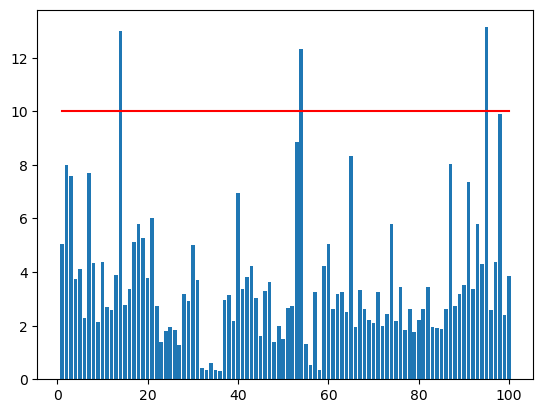

In [10]:
no_df = pd.DataFrame({'score':smape_list})
plt.bar(np.arange(len(no_df))+1, no_df['score'])
plt.plot([1,100], [10, 10], color = 'red')

In [11]:
xgb_params['alpha'] = alpha_list
xgb_params['best_it'] = best_it
xgb_params.head()

,n_estimators,eta,min_child_weight,max_depth,colsample_bytree,subsample,alpha,best_it
0,100,0.01,6,6,0.9,0.9,3,421
1,100,0.01,4,8,0.9,0.9,100,538
2,100,0.01,7,8,0.9,0.9,0,263
3,100,0.01,1,4,0.9,0.9,7,355
4,100,0.01,1,6,0.8,0.9,100,620


In [12]:
merged_test_df.head()


,Unnamed: 0,building_number,temperature,rainfall,windspeed,humidity,hour,day,month,week,...,hour_std,CDH,holiday,sin_time,cos_time,THI,cooling_to_total_area_ratio,max_power,min_power,solar_to_ess_ratio
0,0,1,23.5,0.0,2.2,72,0,3,8,34,...,446.882767,-2.5,0,0.000000,1.000000,58.3456,0.357666,4307.956721,1321.058361,0.0
1,1,1,23.0,0.0,0.9,72,1,3,8,34,...,439.662704,-5.5,0,0.258819,0.965926,57.4456,0.357666,4307.956721,1321.058361,0.0
2,2,1,22.7,0.0,1.5,75,2,3,8,34,...,412.071906,-8.8,0,0.500000,0.866025,57.8725,0.357666,4307.956721,1321.058361,0.0
3,3,1,22.1,0.0,1.3,78,3,3,8,34,...,391.205981,-12.7,0,0.707107,0.707107,57.9376,0.357666,4307.956721,1321.058361,0.0
4,4,1,21.8,0.0,1.0,77,4,3,8,34,...,381.099697,-16.9,0,0.866025,0.500000,56.9961,0.357666,4307.956721,1321.058361,0.0


In [13]:
merged_train_df.head()

,Unnamed: 0,building_number,temperature,rainfall,windspeed,humidity,power_consumption,hour,day,month,...,hour_std,CDH,holiday,sin_time,cos_time,THI,cooling_to_total_area_ratio,max_power,min_power,solar_to_ess_ratio
0,0,1,18.6,0.0,0.9,42.0,1085.28,0,2,6,...,446.882767,-7.4,0,0.000000,1.000000,49.6576,0.357666,2730.72,953.76,0.0
1,1,1,18.0,0.0,1.1,45.0,1047.36,1,2,6,...,439.662704,-15.4,0,0.258819,0.965926,47.7625,0.357666,2730.72,953.76,0.0
2,2,1,17.7,0.0,1.5,45.0,974.88,2,2,6,...,412.071906,-23.7,0,0.500000,0.866025,47.2225,0.357666,2730.72,953.76,0.0
3,3,1,16.7,0.0,1.4,48.0,953.76,3,2,6,...,391.205981,-33.0,0,0.707107,0.707107,44.7856,0.357666,2730.72,953.76,0.0
4,4,1,18.4,0.0,2.8,43.0,986.40,4,2,6,...,381.099697,-40.6,0,0.866025,0.500000,49.0061,0.357666,2730.72,953.76,0.0


In [14]:
xgb_params.to_csv('./parameters/hyperparameter_xgb_final4_lbw.csv', index=False)

In [15]:
xgb_params = pd.read_csv('./parameters/hyperparameter_xgb_final4_lbw.csv')
best_it = xgb_params['best_it'].to_list()
#best_it[0]        # 1051
xgb_params.head()

,n_estimators,eta,min_child_weight,max_depth,colsample_bytree,subsample,alpha,best_it
0,100,0.01,6,6,0.9,0.9,3,421
1,100,0.01,4,8,0.9,0.9,100,538
2,100,0.01,7,8,0.9,0.9,0,263
3,100,0.01,1,4,0.9,0.9,7,355
4,100,0.01,1,6,0.8,0.9,100,620


## 학습

In [17]:
preds = np.array([])
for i in tqdm(np.arange(1,101,1)):

    pred_df = pd.DataFrame()   # 시드별 예측값을 담을 data frame

    for seed in [0,1,2,3,4,5]: # 각 시드별 예측
        y_train = merged_train_df.loc[merged_train_df.building_number == i, 'power_consumption']
        x_train = merged_train_df.loc[merged_train_df.building_number == i].drop(['power_consumption'], axis=1)
        x_test = merged_test_df.loc[merged_test_df.building_number == i]
        
        x_test = x_test[x_train.columns]

        xgb = XGBRegressor(seed = seed, n_estimators = (best_it[i-1]), eta = 0.01,
                           min_child_weight = xgb_params.iloc[i-1, 2], max_depth = xgb_params.iloc[i-1, 3],
                           colsample_bytree=xgb_params.iloc[i-1, 4], subsample=xgb_params.iloc[i-1, 5])

        if xgb_params.iloc[i-1,6] != 0:  # 만약 alpha가 0이 아니면 weighted_mse 사용
            xgb.set_params(**{'objective':weighted_mse(xgb_params.iloc[i-1,6])})

        xgb.fit(x_train, y_train)
        y_pred = xgb.predict(x_test)
        pred_df.loc[:,seed] = y_pred   # 각 시드별 예측 담기

    pred = pred_df.mean(axis=1)        # (i+1)번째 건물의 예측 =  (i+1)번째 건물의 각 시드별 예측 평균값
    preds = np.append(preds, pred)
    

100%|██████████| 100/100 [09:17<00:00,  5.57s/it]


## 테스트

In [18]:
preds = pd.Series(preds)

fig, ax = plt.subplots(100, 1, figsize=(100,200), sharex = True)
ax = ax.flatten()
for i in range(100):
    train_y = merged_train_df.loc[merged_train_df.building_number == i+1, 'power_consumption'].reset_index(drop = True)
    test_y = preds[i*168:(i+1)*168]
    ax[i].scatter(np.arange(2040), train_y)
    ax[i].scatter(np.arange(2040, 2040+168) , test_y)
    ax[i].tick_params(axis='both', which='major', labelsize=6)
    ax[i].tick_params(axis='both', which='minor', labelsize=4)
plt.savefig('./predict_xgb_add_lbw.png')


## 제출

In [19]:
submission = pd.read_csv('./data/sample_submission.csv')
submission['answer'] = preds
submission.to_csv('./data/submission_xgb_noclip_add2_lbw.csv', index = False)


## 1등코드 원본


In [ ]:
# from sklearn.model_selection import PredefinedSplit, GridSearchCV
# from sklearn.metrics import make_scorer
# df = pd.DataFrame(columns = ['n_estimators', 'eta', 'min_child_weight','max_depth', 'colsample_bytree', 'subsample'])
# preds = np.array([])

# grid = {'n_estimators' : [100], 'eta' : [0.01], 'min_child_weight' : np.arange(1, 8, 1),
#         'max_depth' : np.arange(3,9,1) , 'colsample_bytree' :np.arange(0.8, 1.0, 0.1),
#         'subsample' :np.arange(0.8, 1.0, 0.1)} # fix the n_estimators & eta(learning rate)

# for i in tqdm(np.arange(1, 101, 1)):
#     y = merged_train_df.loc[merged_train_df.building_number == i, 'power_consumption']
#     x = merged_train_df.loc[merged_train_df.building_number == i, ].drop('power_consumption', axis=1)
#     y_train, y_test, x_train, x_test = temporal_train_test_split(y = y, X = x, test_size = 168)

#     smape_score = make_scorer(SMAPE, graeter_is_better=False)
#     pds = PredefinedSplit(np.append(-np.ones(len(x)-168), np.zeros(168)))
#     gcv = GridSearchCV(estimator = XGBRegressor(seed = 0, gpu_id = 1,
#                                                  tree_method = 'gpu_hist', predictor= 'gpu_predictor'),
#                          param_grid = grid, scoring = smape_score, cv = pds, refit = True, verbose = True)
#     # gcv = GridSearchCV(estimator = XGBRegressor(seed = 0, gpu_id = 1,
#     #                                             tree_method = 'gpu_hist', predictor= 'gpu_predictor'),
#     #                    param_grid = grid, scoring = smape_score, cv = pds, refit = True, verbose = True)


#     gcv.fit(x_train, y_train)
#     best = gcv.best_estimator_
#     params = gcv.best_params_
#     print(params)
#     pred = best.predict(x_test)
#     building = 'building'+str(i)
#     print(building + '|| SMAPE : {}'.format(SMAPE(y_test, pred)))
#     preds = np.append(preds, pred)
#     df = pd.concat([df, pd.DataFrame(params, index = [0])], axis = 0)
#     df.to_csv('./hyperparameter_xgb.csv', index = False) # save the tuned parameters

## 